<img src="https://learnopencv.com/wp-content/uploads/2022/04/model-compile-768x418.png">

In [1]:
%pip install ultralytics

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.2.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import zipfile
import requests
import cv2
import matplotlib.pyplot as plt
import glob 
import random
import os
from ultralytics import YOLO

In [3]:
os.makedirs('datasets', exist_ok=True)

In [4]:
%cd datasets

c:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-Lite\datasets


c:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-Lite\yoloenv\lib\site-packages\IPython\core\magics\osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


## Download the Dataset

In [5]:
def download_file(url, save_name):
    url = url
    if not os.path.exists(save_name):
        file = requests.get(url)
        open(save_name, 'wb').write(file.content)
        
download_file(
    'https://www.dropbox.com/s/qvglw8pqo16769f/pothole_dataset_v8.zip?dl=1',
    'pothole_dataset_v8.zip'
)

In [6]:
# Unzip the data file
def unzip(zip_file=None):
    try:
        with zipfile.ZipFile(zip_file) as z:
            z.extractall("./")
            print("Extracted all")
    except:
        print("Invalid file")

unzip('pothole_dataset_v8.zip')

Extracted all


In [7]:
%cd ..

c:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-Lite


## Visualize Images from the Dataset

In [8]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [ ]:
def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # Denormalize the coordinates.
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)

        thickness = max(2, int(w/275))
                
        cv2.rectangle(
            image, 
            (xmin, ymin), (xmax, ymax),
            color=(0, 0, 255),
            thickness=thickness
        )
    return image

In [10]:
# Function to plot images with the bounding boxes.
def plot(image_paths, label_paths, num_samples):
    all_images = []
    all_images.extend(glob.glob(image_paths+'/*.jpg'))
    all_images.extend(glob.glob(image_paths+'/*.JPG'))
    
    all_images.sort()

    num_images = len(all_images)
    
    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0,num_images-1)
        image_name = all_images[j]
        image_name = '.'.join(image_name.split(os.path.sep)[-1].split('.')[:-1])
        image = cv2.imread(all_images[j])
        with open(os.path.join(label_paths, image_name+'.txt'), 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:]
                x_c, y_c, w, h = bbox_string.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=1)
    plt.tight_layout()
    plt.show()

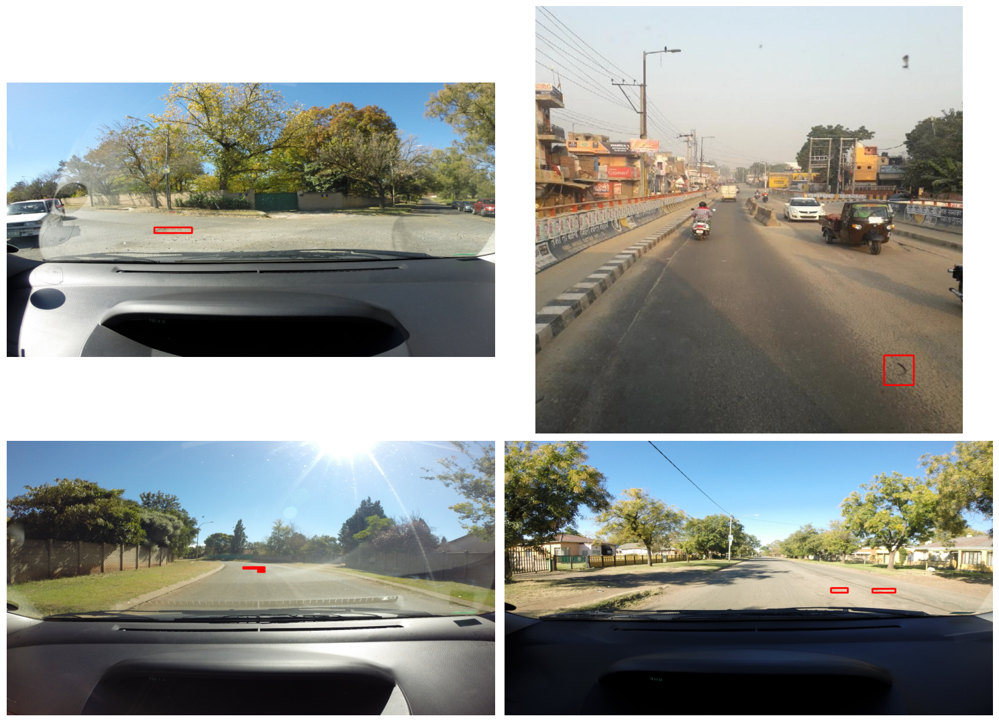

In [11]:
# Visualize a few training images.
plot(
    image_paths='datasets/pothole_dataset_v8/train/images/', 
    label_paths='datasets/pothole_dataset_v8/train/labels/',
    num_samples= 4,
)

## Dataset YAML File

In [12]:

%%writefile pothole_v8.yaml
path: 'pothole_dataset_v8/'
train: 'train/images'
val: 'valid/images'

# class names
names: 
  0: 'pothole'

Overwriting pothole_v8.yaml


In [13]:
%pip install torch torchvision torchaudio

import torch
print(torch.version.cuda)
print(torch.cuda.is_available())


[notice] A new release of pip available: 22.2.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.
11.8
True


## YOLOv8 Nano Training imgsz=640

In [14]:
# Sample training for 5 epoch.
EPOCHS = 100
!yolo task=detect mode=train model=yolov8n.pt imgsz=640 data=pothole_v8.yaml epochs={EPOCHS} batch=32 name=yolov8n_v8_50e

Ultralytics YOLOv8.2.74 🚀 Python-3.10.6 torch-2.0.0+cu118 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=pothole_v8.yaml, epochs=100, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8n_v8_50e, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True


train: Scanning C:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-Lite\datasets\pothole_dataset_v8\train\labels.cache... 6960 images, 10 backgrounds, 0 corrupt: 100%|██████████| 6962/6962 [00:00<?, ?it/s]
train: Scanning C:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-Lite\datasets\pothole_dataset_v8\train\labels.cache... 6960 images, 10 backgrounds, 0 corrupt: 100%|██████████| 6962/6962 [00:00<?, ?it/s]

val: Scanning C:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-Lite\datasets\pothole_dataset_v8\valid\labels.cache... 271 images, 0 backgrounds, 0 corrupt: 100%|██████████| 271/271 [00:00<?, ?it/s]
val: Scanning C:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-Lite\datasets\pothole_dataset_v8\valid\labels.cache... 271 images, 0 backgrounds, 0 corrupt: 100%|██████████| 271/271 [00:00<?, ?it/s]

  0%|          | 0/218 [00:00<?, ?it/s]
      1/100      4.56G      3.036      7.354      2.041         79        640:   0%|          | 0/218 [00:03<

## Evaluation on Validation Images

In [15]:
!yolo task=detect mode=val model=runs/detect/yolov8n_v8_50e3/weights/best.pt name=yolov8n_eval data=pothole_v8.yaml

Traceback (most recent call last):
  File "c:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-Lite\yoloenv\lib\site-packages\urllib3\connection.py", line 196, in _new_conn
    sock = connection.create_connection(
  File "c:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-Lite\yoloenv\lib\site-packages\urllib3\util\connection.py", line 60, in create_connection
    for res in socket.getaddrinfo(host, port, family, socket.SOCK_STREAM):
  File "C:\Python310\lib\socket.py", line 955, in getaddrinfo
    for res in _socket.getaddrinfo(host, port, family, type, proto, flags):
socket.gaierror: [Errno 11001] getaddrinfo failed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "c:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-Lite\yoloenv\lib\site-packages\urllib3\connectionpool.py", line 789, in urlopen
    response = self._make_request(
  File "c:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-

## Inference on Validation Images

In [16]:
!yolo task=detect \
mode=predict \
model= datasets/runs/detect/yolov8n_v8_50_9602/weights/best.pt \
source= datasets/pothole_dataset_v8/valid/images\
imgsz= 960 \
name= video_infer_960_val \
hide_labels=True

WARNING ⚠️ 'hide_labels' is deprecated and will be removed in in the future. Please use 'show_labels' instead.


Traceback (most recent call last):
  File "c:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-Lite\yoloenv\lib\site-packages\urllib3\connection.py", line 196, in _new_conn
    sock = connection.create_connection(
  File "c:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-Lite\yoloenv\lib\site-packages\urllib3\util\connection.py", line 60, in create_connection
    for res in socket.getaddrinfo(host, port, family, socket.SOCK_STREAM):
  File "C:\Python310\lib\socket.py", line 955, in getaddrinfo
    for res in _socket.getaddrinfo(host, port, family, type, proto, flags):
socket.gaierror: [Errno 11001] getaddrinfo failed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "c:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-Lite\yoloenv\lib\site-packages\urllib3\connectionpool.py", line 789, in urlopen
    response = self._make_request(
  File "c:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-

## Visualize Validation Results

In [17]:
# Plot and visualize images in a 2x2 grid.
def visualize(result_dir, num_samples=4):
    """
    Function accepts a list of images and plots
    them in a 2x2 grid.
    """
    plt.figure(figsize=(20, 12))
    image_names = glob.glob(os.path.join(result_dir, '*.jpg'))
    random.shuffle(image_names)
    for i, image_name in enumerate(image_names):
        image = plt.imread(image_name)
        plt.subplot(2, 2, i+1)
        plt.imshow(image)
        plt.axis('off')
        if i == num_samples-1:
            break
    plt.tight_layout()
    plt.show()

In [18]:
visualize('runs/detect/yolov8n_v8_50e_infer640/')

<Figure size 2000x1200 with 0 Axes>

# Training YOLOv8n - 960 img sz

In [19]:
# Sample training for 5 epoch.
EPOCHS = 50
!yolo task=detect mode=train model=yolov8n.pt imgsz=960 data=pothole_v8.yaml epochs={EPOCHS} batch=16 name=yolov8n_v8_50_960

Ultralytics YOLOv8.2.74 🚀 Python-3.10.6 torch-2.0.0+cu118 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)


train: Scanning C:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-Lite\datasets\pothole_dataset_v8\train\labels.cache... 6960 images, 10 backgrounds, 0 corrupt: 100%|██████████| 6962/6962 [00:00<?, ?it/s]
train: Scanning C:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-Lite\datasets\pothole_dataset_v8\train\labels.cache... 6960 images, 10 backgrounds, 0 corrupt: 100%|██████████| 6962/6962 [00:00<?, ?it/s]

val: Scanning C:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-Lite\datasets\pothole_dataset_v8\valid\labels.cache... 271 images, 0 backgrounds, 0 corrupt: 100%|██████████| 271/271 [00:00<?, ?it/s]
val: Scanning C:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-Lite\datasets\pothole_dataset_v8\valid\labels.cache... 271 images, 0 backgrounds, 0 corrupt: 100%|██████████| 271/271 [00:00<?, ?it/s]

  0%|          | 0/436 [00:00<?, ?it/s]
       1/50      4.92G      3.509      11.49      2.049         38        960:   0%|          | 0/436 [00:04<


engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=pothole_v8.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=960, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8n_v8_50_960, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=False, optimize=False, int8=Fa


      32/50      4.97G      1.748      1.455      1.425         52        960:  69%|██████▊   | 299/436 [23:50<10:51,  4.76s/it]
      32/50      4.97G      1.748      1.455      1.425         52        960:  69%|██████▉   | 300/436 [23:50<10:49,  4.78s/it]
      32/50      4.97G      1.747      1.455      1.425         58        960:  69%|██████▉   | 300/436 [23:54<10:49,  4.78s/it]
      32/50      4.97G      1.747      1.455      1.425         58        960:  69%|██████▉   | 301/436 [23:54<10:42,  4.76s/it]
      32/50      4.97G      1.747      1.455      1.425         49        960:  69%|██████▉   | 301/436 [23:59<10:42,  4.76s/it]
      32/50      4.97G      1.747      1.455      1.425         49        960:  69%|██████▉   | 302/436 [23:59<10:40,  4.78s/it]
      32/50      4.97G      1.747      1.454      1.425         53        960:  69%|██████▉   | 302/436 [24:04<10:40,  4.78s/it]
      32/50      4.97G      1.747      1.454      1.425         53        960:  69%|██████▉   | 

<img src="https://learnopencv.com/wp-content/uploads/2024/06/results.png" width = 800 height = 400>

| MODEL   | TRAIN IMAGE SIZE | mAP@0.5 |
|---------|------------------|---------|
| YOLOv8n | (640, 640)       | 0.332   |
| YOLOv8n | (960, 960)       | **0.44** |
| YOLOv8n | (1280, 1280)     | 0.40    |
|YOLOV10n | (960, 960)       | 0.404   |


## Inference on Video

In [20]:
!yolo task=detect \
mode=predict \
model= datasets/runs/detect/yolov8n_v8_50_9602/weights/best.pt \
source= pothole_dataset_v8/valid/val_video.mp4\
imgsz= 960 \
name= video_infer_960_val \
hide_labels=True

WARNING ⚠️ 'hide_labels' is deprecated and will be removed in in the future. Please use 'show_labels' instead.


Traceback (most recent call last):
  File "C:\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "C:\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "c:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-Lite\yoloenv\Scripts\yolo.exe\__main__.py", line 7, in <module>
    sys.exit(entrypoint())
  File "c:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-Lite\yoloenv\lib\site-packages\ultralytics\cfg\__init__.py", line 807, in entrypoint
    model = YOLO(model, task=task)
  File "c:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-Lite\yoloenv\lib\site-packages\ultralytics\models\yolo\model.py", line 23, in __init__
    super().__init__(model=model, task=task, verbose=verbose)
  File "c:\Users\Vaishali Thakur\Desktop\ML\Deployment-YOLOv8-OAK-D-Lite\yoloenv\lib\site-packages\ultralytics\engine\model.py", line 142, in __init__
    self._load(model, task=task)
  File "c:\User

<img src="https://learnopencv.com/wp-content/uploads/2024/06/direct-pred-val_video-e.gif">

****************************************************************************************************************************************************************************************************************

# Luxonis YOLO to Blob Direct Conversion Toolkit

Tooklit: https://tools.luxonis.com/

<img src="https://learnopencv.com/wp-content/uploads/2024/06/Yolo-conversion.png" width=500 height=400>

****************************************************************************************************************************************************************************************************************

## Convert YOLOv8n to OpenVINO IR FORMAT

<img src="https://docs.openvino.ai/archive/2023.2/_images/ov_homepage_diagram.png" width=500 height=400>

In [21]:
model = YOLO('/home/jaykumaran/Blogs/Poth-hole-Detection/datasets/runs/detect/yolov8n_v8_50_9602/weights/best.pt')

FileNotFoundError: [Errno 2] No such file or directory: '\\home\\jaykumaran\\Blogs\\Poth-hole-Detection\\datasets\\runs\\detect\\yolov8n_v8_50_9602\\weights\\best.pt'

In [ ]:
model.export(format='openvino', imgsz = (960,960))

****************************************************************************************************************************************************************************************************************

# Blob Conversion From OpenVINO IR or ONNX

Toolkit: https://blobconverter.luxonis.com/

<img src ="https://learnopencv.com/wp-content/uploads/2024/06/BlobConverter-Interface.png">

<img src="https://learnopencv.com/wp-content/uploads/2024/06/BlobConverter-actual.png" width=800 height=500>

****************************************************************************************************************************************************************************************************************

<img src="https://learnopencv.com/wp-content/uploads/2024/06/Oak-devices-edited-scaled.jpg" width=400 height = 300>

****************************************************************************************************************************************************************************************************************

# YOLOv10 imgsz=960

Clone yolov10 repo and install dependencies incase of `dill` error

https://github.com/ultralytics/ultralytics/issues/13295

In [ ]:
!git clone https://github.com/THU-MIG/yolov10.git

In [ ]:
cd yolov10

In [ ]:
!pip install -q .

In [ ]:
!pip install -q huggingface_hub

In [ ]:
cd ..

In [ ]:
# Sample training for 5 epoch.
EPOCHS = 50
!yolo task=detect mode=train model=yolov10n.pt imgsz=960 data=pothole_v8.yaml epochs={EPOCHS} batch=8 name=yolov10n_v10_50_960

****************************************************************************************************************************************************************************************************************